In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

!pip install gdown
!gdown --id 1RggdfEs4RyBQKNELokmhCvJ2dUY9KsDl

# 1RggdfEs4RyBQKNELokmhCvJ2dUY9KsDl

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1RggdfEs4RyBQKNELokmhCvJ2dUY9KsDl
From (redirected): https://drive.google.com/uc?id=1RggdfEs4RyBQKNELokmhCvJ2dUY9KsDl&confirm=t&uuid=99a1123d-da81-4f7b-8b4f-49952006905f
To: /kaggle/working/Dataset.zip
100%|███████████████████████████████████████| 2.70G/2.70G [00:21<00:00, 127MB/s]


In [2]:
import zipfile
import os

zip_path = "/kaggle/working/Dataset.zip"
extract_path = "/content/extracted_dataset"

# Check if zip file exists
if not os.path.exists(zip_path):
    print(f"Error: Zip file '{zip_path}' does not exist.")
    exit()

# Check contents of the zip file
print("Contents of the zip file:")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    for member in zip_ref.namelist():
        print(member)

# Create extraction directory if it doesn't exist
os.makedirs(extract_path, exist_ok=True)

# Extract the zip file
print(f"\nExtracting zip file to: {extract_path}")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
print("Extraction completed!")

# Check contents of the extracted directory
print(f"\nContents of the extracted directory '{extract_path}':")
if os.path.exists(extract_path):
    for root, dirs, files in os.walk(extract_path):
        level = root.replace(extract_path, '').count(os.sep)
        indent = ' ' * 4 * (level)
        print('{}{}/'.format(indent, os.path.basename(root)))
        subindent = ' ' * 4 * (level + 1)
        for f in files:
            print('{}{}'.format(subindent, f))
else:
    print(f"Extraction directory '{extract_path}' does not exist.")

Contents of the zip file:
Dataset/
Dataset/250 RPM/
Dataset/250 RPM/Normal/
Dataset/250 RPM/Normal/11 distance from machine/
Dataset/250 RPM/Normal/11 distance from machine/frame_0003.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0013.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0015.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0025.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0030.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0031.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0033.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0034.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0037.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0041.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0042.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0044.png
Dataset/250 RPM/Normal/11 distance from machine/frame_0050.png
Dataset/250 RPM/Normal/11 distance from machine/frame_00

# Random Forest ROI Classification


## 1. Import Libraries and Setup


In [3]:
import os
import cv2
import numpy as np
import torch
from torchvision import transforms as T
from torch.utils.data import Dataset, DataLoader
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob
from tqdm import tqdm
from PIL import Image
import joblib

# Configuration
DATA_ROOT = '/content/extracted_dataset/Dataset/250 RPM'  # Updated to use local path
BATCH_SIZE = 16
EPOCHS = 5
LR = 1e-4
IMG_EXTS = ('.png', '.jpg', '.jpeg')

print("Libraries imported successfully!")

Libraries imported successfully!


## 2. Initialize Data Structures


In [4]:
class_names = []
samples = []
class_to_idx = {}
all_features = []
all_labels = []

print("Data structures initialized")


Data structures initialized


## 3. Discover Classes and Create Mapping


In [5]:
print("Discovering classes...")

# Detect all class folders (direct subfolders)
for cname in sorted(os.listdir(DATA_ROOT)):
    class_dir = os.path.join(DATA_ROOT, cname)
    if not os.path.isdir(class_dir):
        continue

    class_to_idx[cname] = len(class_names)
    class_names.append(cname)

print(f"Detected classes: {class_names}")
print(f"Class mapping: {class_to_idx}")

Discovering classes...
Detected classes: ['Fault', 'Normal']
Class mapping: {'Fault': 0, 'Normal': 1}


## 4. Extract Features from Images


In [6]:
print("Starting feature extraction from images...")

for cname in class_names:
    class_dir = os.path.join(DATA_ROOT, cname)
    count = 0
    class_features = []
    class_labels = []

    print(f"Processing class: {cname}")

    # Process images in this class
    for root, dirs, files in os.walk(class_dir):
        for f in tqdm(files, desc=f"Processing {cname}"):
            if f.lower().endswith(IMG_EXTS):
                img_path = os.path.join(root, f)

                try:
                    # Load and preprocess image
                    img = cv2.imread(img_path)
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, (224, 224))

                    # Convert to different color spaces
                    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
                    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

                    # Extract histogram features
                    gray_hist = cv2.calcHist([gray], [0], None, [256], [0, 256]).flatten()
                    h_hist = cv2.calcHist([hsv], [0], None, [180], [0, 180]).flatten()
                    s_hist = cv2.calcHist([hsv], [1], None, [256], [0, 256]).flatten()
                    v_hist = cv2.calcHist([hsv], [2], None, [256], [0, 256]).flatten()

                    # Normalize histograms
                    gray_hist = gray_hist / (gray_hist.sum() + 1e-8)
                    h_hist = h_hist / (h_hist.sum() + 1e-8)
                    s_hist = s_hist / (s_hist.sum() + 1e-8)
                    v_hist = v_hist / (v_hist.sum() + 1e-8)

                    hist_features = np.concatenate([gray_hist, h_hist, s_hist, v_hist])

                    # Extract texture features
                    texture_features = []

                    # Statistical features
                    texture_features.append(np.mean(gray))
                    texture_features.append(np.std(gray))
                    texture_features.append(np.var(gray))
                    texture_features.append(np.median(gray))
                    texture_features.append(np.max(gray))
                    texture_features.append(np.min(gray))

                    # Gradient features
                    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
                    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
                    grad_magnitude = np.sqrt(grad_x**2 + grad_y**2)

                    texture_features.append(np.mean(grad_magnitude))
                    texture_features.append(np.std(grad_magnitude))
                    texture_features.append(np.max(grad_magnitude))

                    # Edge density
                    edges = cv2.Canny(gray, 50, 150)
                    edge_density = np.sum(edges > 0) / (edges.shape[0] * edges.shape[1])
                    texture_features.append(edge_density)

                    texture_features = np.array(texture_features)

                    # Extract frequency features
                    f_transform = np.fft.fft2(gray)
                    f_shift = np.fft.fftshift(f_transform)
                    magnitude_spectrum = np.log(np.abs(f_shift) + 1)

                    freq_features = []
                    freq_features.append(np.mean(magnitude_spectrum))
                    freq_features.append(np.std(magnitude_spectrum))
                    freq_features.append(np.max(magnitude_spectrum))
                    freq_features.append(np.min(magnitude_spectrum))

                    # Energy in different frequency bands
                    h, w = magnitude_spectrum.shape
                    center_h, center_w = h // 2, w // 2

                    # Low frequency energy (center region)
                    low_freq = magnitude_spectrum[center_h-20:center_h+20, center_w-20:center_w+20]
                    freq_features.append(np.mean(low_freq))

                    # High frequency energy (peripheral region)
                    mask = np.ones_like(magnitude_spectrum)
                    mask[center_h-20:center_h+20, center_w-20:center_w+20] = 0
                    high_freq = magnitude_spectrum * mask
                    freq_features.append(np.mean(high_freq))

                    freq_features = np.array(freq_features)

                    # Combine all features
                    combined_features = np.concatenate([hist_features, texture_features, freq_features])

                    class_features.append(combined_features)
                    class_labels.append(class_to_idx[cname])
                    count += 1

                    # Limit samples per class to avoid memory issues
                    # if count >= 1000:
                    #     break

                except Exception as e:
                    print(f"Error processing {img_path}: {e}")
                    continue

        if count >= 1000:
            break

    # Add to main lists
    all_features.extend(class_features)
    all_labels.extend(class_labels)

    print(f"Class '{cname}': {count} samples processed")

print(f"Total samples processed: {len(all_features)}")

Starting feature extraction from images...
Processing class: Fault


Processing Fault: 0it [00:00, ?it/s]
Processing Fault: 0it [00:00, ?it/s]
Processing Fault: 100%|██████████| 3600/3600 [00:25<00:00, 138.72it/s]


Class 'Fault': 3600 samples processed
Processing class: Normal


Processing Normal: 0it [00:00, ?it/s]
Processing Normal: 100%|██████████| 3600/3600 [00:25<00:00, 141.66it/s]

Class 'Normal': 3600 samples processed
Total samples processed: 7200


## 5. Prepare Data Arrays


In [7]:
# Convert to numpy arrays
X = np.array(all_features)
y = np.array(all_labels)

print(f"Feature matrix shape: {X.shape}")
print(f"Labels shape: {y.shape}")
print(f"Number of features per sample: {X.shape[1]}")

# Check for any NaN or infinite values
print(f"NaN values in features: {np.isnan(X).sum()}")
print(f"Infinite values in features: {np.isinf(X).sum()}")

# Replace any NaN or infinite values with 0
X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)

Feature matrix shape: (7200, 964)
Labels shape: (7200,)
Number of features per sample: 964
NaN values in features: 0
Infinite values in features: 0


## 6. Train/Test Split


In [8]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f"Training set size: {X_train.shape[0]}")
print(f"Test set size: {X_test.shape[0]}")
print(f"Training set distribution:")
for i, class_name in enumerate(class_names):
    count = np.sum(y_train == i)
    print(f"  {class_name}: {count} samples")

print(f"Test set distribution:")
for i, class_name in enumerate(class_names):
    count = np.sum(y_test == i)
    print(f"  {class_name}: {count} samples")

Training set size: 5760
Test set size: 1440
Training set distribution:
  Fault: 2880 samples
  Normal: 2880 samples
Test set distribution:
  Fault: 720 samples
  Normal: 720 samples


## 7. Feature Scaling


In [9]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Feature scaling completed")
print(f"Training features - Mean: {X_train_scaled.mean():.4f}, Std: {X_train_scaled.std():.4f}")
print(f"Test features - Mean: {X_test_scaled.mean():.4f}, Std: {X_test_scaled.std():.4f}")

Feature scaling completed
Training features - Mean: 0.0000, Std: 0.7935
Test features - Mean: 0.0009, Std: 0.8404


## 8. Initialize and Train Random Forest Model


In [10]:
# Initialize Random Forest model
rf_model = RandomForestClassifier(
    n_estimators=200,
    max_depth=15,
    min_samples_split=5,
    min_samples_leaf=2,
    random_state=42,
    n_jobs=-1  # Use all CPU cores
)

print("Random Forest model initialized with parameters:")
print(f"  Number of estimators: {rf_model.n_estimators}")
print(f"  Max depth: {rf_model.max_depth}")
print(f"  Min samples split: {rf_model.min_samples_split}")
print(f"  Min samples leaf: {rf_model.min_samples_leaf}")

# Train the model
print("Starting model training...")
rf_model.fit(X_train_scaled, y_train)
print("Model training completed!")

Random Forest model initialized with parameters:
  Number of estimators: 200
  Max depth: 15
  Min samples split: 5
  Min samples leaf: 2
Starting model training...
Model training completed!


## 9. Make Predictions


In [11]:
# Make predictions on test set
print("Making predictions on test set...")
y_pred = rf_model.predict(X_test_scaled)
y_pred_proba = rf_model.predict_proba(X_test_scaled)

print("Predictions completed")
print(f"Predictions shape: {y_pred.shape}")
print(f"Prediction probabilities shape: {y_pred_proba.shape}")

Making predictions on test set...
Predictions completed
Predictions shape: (1440,)
Prediction probabilities shape: (1440, 2)


## 10. Calculate Accuracy and Basic Metrics


In [12]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")
print(f"Class mapping: {dict(enumerate(class_names))}")

# Per-class accuracy
print("\nPer-class accuracy:")
for i, class_name in enumerate(class_names):
    class_mask = y_test == i
    if np.sum(class_mask) > 0:
        class_accuracy = accuracy_score(y_test[class_mask], y_pred[class_mask])
        print(f"  {class_name}: {class_accuracy:.4f}")

Test Accuracy: 1.0000
Class mapping: {0: 'Fault', 1: 'Normal'}

Per-class accuracy:
  Fault: 1.0000
  Normal: 1.0000


## 11. Feature Importance Analysis


In [13]:
# Analyze feature importance
feature_importance = rf_model.feature_importances_
print(f"Feature importance array shape: {feature_importance.shape}")

# Top 10 most important features
print(f"\nTop 10 most important features:")
top_indices = np.argsort(feature_importance)[-10:]
for i, idx in enumerate(reversed(top_indices)):
    print(f"  {i+1}. Feature {idx}: {feature_importance[idx]:.4f}")

# Feature importance statistics
print(f"\nFeature importance statistics:")
print(f"  Mean importance: {feature_importance.mean():.6f}")
print(f"  Std importance: {feature_importance.std():.6f}")
print(f"  Max importance: {feature_importance.max():.6f}")
print(f"  Min importance: {feature_importance.min():.6f}")

Feature importance array shape: (964,)

Top 10 most important features:
  1. Feature 171: 0.0200
  2. Feature 513: 0.0200
  3. Feature 904: 0.0200
  4. Feature 864: 0.0200
  5. Feature 157: 0.0150
  6. Feature 209: 0.0150
  7. Feature 190: 0.0150
  8. Feature 868: 0.0150
  9. Feature 473: 0.0150
  10. Feature 847: 0.0150

Feature importance statistics:
  Mean importance: 0.001037
  Std importance: 0.002856
  Max importance: 0.020000
  Min importance: 0.000000


## 12. Detailed Classification Report


In [14]:
# Generate detailed classification report
print("\nDetailed Classification Report:")
print(classification_report(y_test, y_pred, target_names=class_names))


Detailed Classification Report:
              precision    recall  f1-score   support

       Fault       1.00      1.00      1.00       720
      Normal       1.00      1.00      1.00       720

    accuracy                           1.00      1440
   macro avg       1.00      1.00      1.00      1440
weighted avg       1.00      1.00      1.00      1440



## 13. Confusion Matrix Visualization


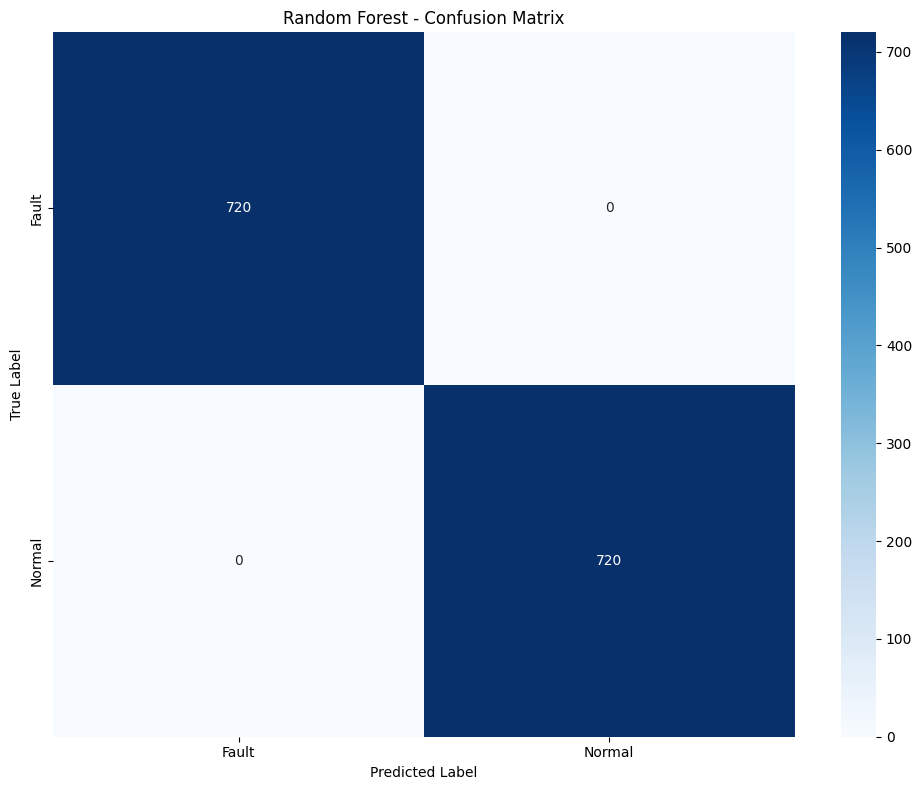

Confusion matrix saved as 'rf_confusion_matrix.png'


In [15]:
# Create and plot confusion matrix
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Random Forest - Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.savefig('rf_confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

print("Confusion matrix saved as 'rf_confusion_matrix.png'")

## 14. Cross-Validation Analysis


In [16]:
# Perform cross-validation
print("Performing 5-fold cross-validation...")
cv_scores = cross_val_score(rf_model, X_train_scaled, y_train, cv=5, scoring='accuracy')

print(f"Cross-validation scores: {cv_scores}")
print(f"Mean CV accuracy: {cv_scores.mean():.4f}")
print(f"Standard deviation: {cv_scores.std():.4f}")
print(f"95% confidence interval: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")


Performing 5-fold cross-validation...
Cross-validation scores: [1. 1. 1. 1. 1.]
Mean CV accuracy: 1.0000
Standard deviation: 0.0000
95% confidence interval: 1.0000 (+/- 0.0000)


## 15. Feature Importance Visualization


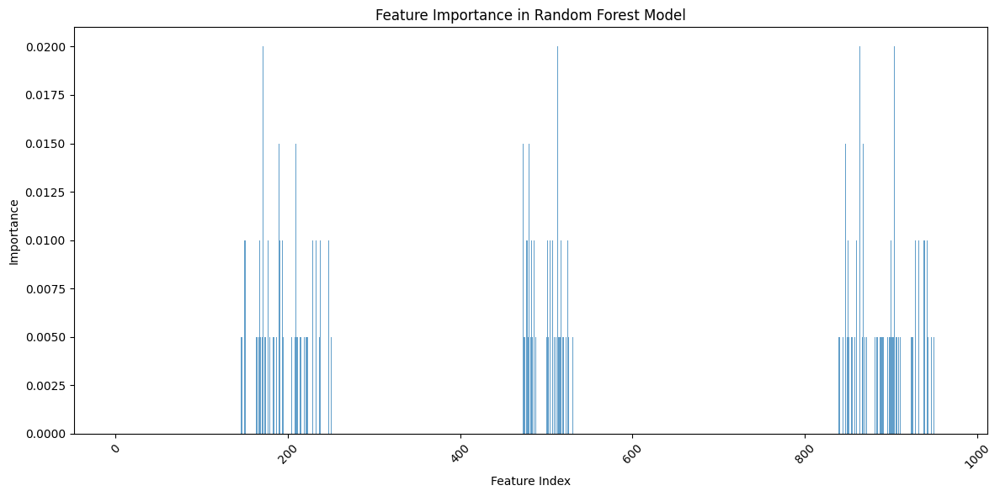

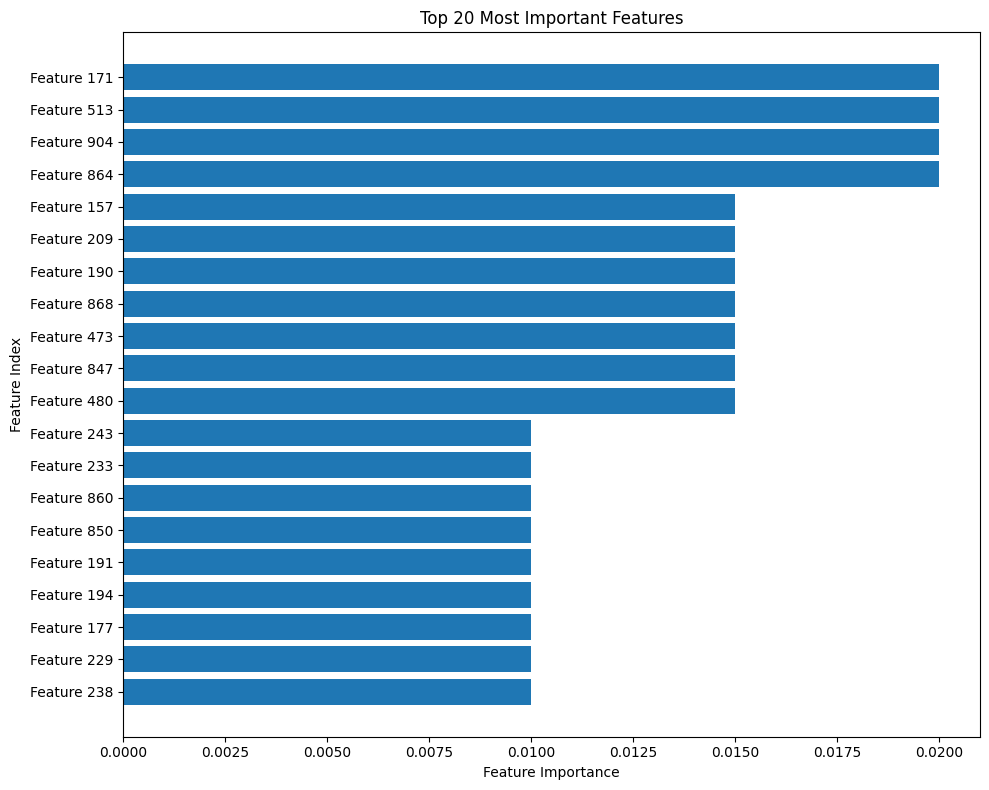

In [17]:
# Plot feature importance
plt.figure(figsize=(12, 6))
feature_indices = np.arange(len(feature_importance))
plt.bar(feature_indices, feature_importance, alpha=0.7)
plt.title('Feature Importance in Random Forest Model')
plt.xlabel('Feature Index')
plt.ylabel('Importance')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot top 20 most important features
top_20_indices = np.argsort(feature_importance)[-20:]
plt.figure(figsize=(10, 8))
plt.barh(range(20), feature_importance[top_20_indices])
plt.title('Top 20 Most Important Features')
plt.xlabel('Feature Importance')
plt.ylabel('Feature Index')
plt.yticks(range(20), [f'Feature {idx}' for idx in top_20_indices])
plt.tight_layout()
plt.show()

## 16. Model Performance Summary


In [18]:
# Summary of model performance
print("="*50)
print("MODEL PERFORMANCE SUMMARY")
print("="*50)
print(f"Dataset: {DATA_ROOT}")
print(f"Total samples: {len(all_features)}")
print(f"Number of classes: {len(class_names)}")
print(f"Classes: {class_names}")
print(f"Feature vector size: {X.shape[1]}")
print(f"Training samples: {X_train.shape[0]}")
print(f"Test samples: {X_test.shape[0]}")
print(f"Test accuracy: {accuracy:.4f}")
print(f"Cross-validation accuracy: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")
print(f"Model parameters:")
print(f"  - Number of trees: {rf_model.n_estimators}")
print(f"  - Max depth: {rf_model.max_depth}")
print(f"  - Min samples split: {rf_model.min_samples_split}")
print(f"  - Min samples leaf: {rf_model.min_samples_leaf}")
print("="*50)

MODEL PERFORMANCE SUMMARY
Dataset: /content/extracted_dataset/Dataset/250 RPM
Total samples: 7200
Number of classes: 2
Classes: ['Fault', 'Normal']
Feature vector size: 964
Training samples: 5760
Test samples: 1440
Test accuracy: 1.0000
Cross-validation accuracy: 1.0000 (+/- 0.0000)
Model parameters:
  - Number of trees: 200
  - Max depth: 15
  - Min samples split: 5
  - Min samples leaf: 2


## 17. Save Model and Results


In [19]:
# Prepare model data for saving
model_data = {
    'model': rf_model,
    'scaler': scaler,
    'class_names': class_names,
    'class_to_idx': class_to_idx,
    'test_accuracy': accuracy,
    'cv_scores': cv_scores,
    'feature_importance': feature_importance,
    'feature_count': X.shape[1]
}

# Save the model
joblib.dump(model_data, 'random_forest_roi_model.pkl')
print("Model and metadata saved as 'random_forest_roi_model.pkl'")

# Save feature importance as separate file
np.save('feature_importance.npy', feature_importance)
print("Feature importance saved as 'feature_importance.npy'")

print("\nFiles saved:")
print("  - random_forest_roi_model.pkl (complete model and metadata)")
print("  - feature_importance.npy (feature importance array)")
print("  - rf_confusion_matrix.png (confusion matrix plot)")

Model and metadata saved as 'random_forest_roi_model.pkl'
Feature importance saved as 'feature_importance.npy'

Files saved:
  - random_forest_roi_model.pkl (complete model and metadata)
  - feature_importance.npy (feature importance array)
  - rf_confusion_matrix.png (confusion matrix plot)


#Vision Transformer (ViT B-16)

In [20]:
import os
import cv2
import numpy as np
import torch
from torchvision import transforms as T
from torchvision.models import vit_b_16, ViT_B_16_Weights
from torchvision.models import swin_v2_b, Swin_V2_B_Weights  # NEW: Swin Transformer
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix  # NEW: Additional metrics
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob
from tqdm import tqdm
from PIL import Image

##Configuration


In [21]:
# --- CONFIG ---
DATA_ROOT = '/content/extracted_dataset/Dataset/250 RPM'
BATCH_SIZE = 16
EPOCHS = 2
LR = 1e-3
IMG_EXTS = ('.png', '.jpg', '.jpeg')

print(f"Configuration:")
print(f"Data Root: {DATA_ROOT}")
print(f"Batch Size: {BATCH_SIZE}")
print(f"Epochs: {EPOCHS}")
print(f"Learning Rate: {LR}")
print(f"Supported Image Extensions: {IMG_EXTS}")

Configuration:
Data Root: /content/extracted_dataset/Dataset/250 RPM
Batch Size: 16
Epochs: 2
Learning Rate: 0.001
Supported Image Extensions: ('.png', '.jpg', '.jpeg')


##Custom Dataset Class


In [22]:
class FrameFolderDataset(Dataset):
    """
    Custom Dataset class for loading images from folders organized by class.
    Each subfolder represents a different class.
    """
    def __init__(self, samples, transform=None):
        self.samples = samples  # list of (img_path, label)
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        img = Image.open(img_path).convert('RGB')
        if self.transform:
            img = self.transform(img)
        return img, label

##Dataset Creation Functions


In [23]:
def make_dataset(data_root):
    """
    Create dataset by scanning folder structure.
    Expects folder structure: data_root/class_name/images

    Returns:
        samples: List of (image_path, class_index) tuples
        class_names: List of class names
    """
    class_names = []
    samples = []
    class_to_idx = {}

    # Detect all class folders (direct subfolders)
    for cname in sorted(os.listdir(data_root)):
        class_dir = os.path.join(data_root, cname)
        if not os.path.isdir(class_dir):
            continue

        class_to_idx[cname] = len(class_names)
        class_names.append(cname)
        count = 0

        # Walk through subdirectories to find all images
        for root, _, files in os.walk(class_dir):
            for f in files:
                if f.lower().endswith(IMG_EXTS):
                    samples.append((os.path.join(root, f), class_to_idx[cname]))
                    count += 1

        print(f"Class '{cname}': {count} images")

    print(f"Detected classes: {class_names}")
    return samples, class_names

##Data Loading and Preprocessing


In [24]:
# 1. Gather samples and class names
samples, class_names = make_dataset(DATA_ROOT)
print(f"Found {len(samples)} images.")

if len(samples) == 0:
    print("No images found. Check your folder structure.")
    print("Expected structure: DATA_ROOT/class_name/images")
else:
    print(f"Number of classes: {len(class_names)}")
    print(f"Total samples: {len(samples)}")

Class 'Fault': 68400 images
Class 'Normal': 28800 images
Detected classes: ['Fault', 'Normal']
Found 97200 images.
Number of classes: 2
Total samples: 97200


##Train-Test Split

In [25]:
# # 2. Train/test split (80-20 split with stratification)
# train_samples, test_samples = train_test_split(
#     samples,
#     test_size=0.2,
#     random_state=42,
#     stratify=[s[1] for s in samples]  # Stratify by class labels
# )

# print(f"Training samples: {len(train_samples)}")
# print(f"Test samples: {len(test_samples)}")

# # Print class distribution
# from collections import Counter
# train_dist = Counter([s[1] for s in train_samples])
# test_dist = Counter([s[1] for s in test_samples])

# print("\nClass distribution in training set:")
# for class_idx, count in train_dist.items():
#     print(f"  {class_names[class_idx]}: {count}")

# print("\nClass distribution in test set:")
# for class_idx, count in test_dist.items():
#     print(f"  {class_names[class_idx]}: {count}")

import numpy as np
from collections import Counter, defaultdict

def stratified_split(samples, train_ratio=0.7, val_ratio=0.2, test_ratio=0.1, random_state=42):
    """
    Professional stratified split into train/validation/test sets.
    """
    np.random.seed(random_state)

    # Group samples by class
    class_samples = defaultdict(list)
    for i, (sample, label) in enumerate(samples):
        class_samples[label].append(i)

    train_indices, val_indices, test_indices = [], [], []

    # Split each class proportionally
    for class_label, indices in class_samples.items():
        np.random.shuffle(indices)
        n_samples = len(indices)

        n_train = int(n_samples * train_ratio)
        n_val = int(n_samples * val_ratio)
        # n_test = remaining samples

        train_indices.extend(indices[:n_train])
        val_indices.extend(indices[n_train:n_train + n_val])
        test_indices.extend(indices[n_train + n_val:])

    # Create splits
    train_samples = [samples[i] for i in train_indices]
    val_samples = [samples[i] for i in val_indices]
    test_samples = [samples[i] for i in test_indices]

    return train_samples, val_samples, test_samples

# 2. Train/validation/test split (70-20-10 split with stratification)
train_samples, val_samples, test_samples = stratified_split(samples, 0.7, 0.2, 0.1, 42)

print(f"Training samples: {len(train_samples)}")
print(f"Validation samples: {len(val_samples)}")
print(f"Test samples: {len(test_samples)}")

# Print class distribution
train_dist = Counter([s[1] for s in train_samples])
val_dist = Counter([s[1] for s in val_samples])
test_dist = Counter([s[1] for s in test_samples])

print("\nClass distribution in training set:")
for class_idx, count in train_dist.items():
    print(f"  {class_names[class_idx]}: {count}")

print("\nClass distribution in validation set:")
for class_idx, count in val_dist.items():
    print(f"  {class_names[class_idx]}: {count}")

print("\nClass distribution in test set:")
for class_idx, count in test_dist.items():
    print(f"  {class_names[class_idx]}: {count}")

# Verify split percentages
total_samples = len(samples)
print(f"\nSplit percentages:")
print(f"  Training: {len(train_samples)/total_samples:.1%}")
print(f"  Validation: {len(val_samples)/total_samples:.1%}")
print(f"  Test: {len(test_samples)/total_samples:.1%}")

Training samples: 68040
Validation samples: 19440
Test samples: 9720

Class distribution in training set:
  Fault: 47880
  Normal: 20160

Class distribution in validation set:
  Fault: 13680
  Normal: 5760

Class distribution in test set:
  Fault: 6840
  Normal: 2880

Split percentages:
  Training: 70.0%
  Validation: 20.0%
  Test: 10.0%


##Data Transforms and Loaders


In [26]:
# # 3. Set up transforms using ViT pretrained weights
# weights = ViT_B_16_Weights.DEFAULT
# transform = weights.transforms()

# print("Transform pipeline:")
# print(transform)

# # 4. Create datasets and data loaders
# train_ds = FrameFolderDataset(train_samples, transform)
# test_ds = FrameFolderDataset(test_samples, transform)

# train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
# test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE)

# print(f"Training batches: {len(train_loader)}")
# print(f"Test batches: {len(test_loader)}")


# 3. Set up transforms using ViT pretrained weights
weights = ViT_B_16_Weights.DEFAULT
transform = weights.transforms()

print("Transform pipeline:")
print(transform)

# 4. Create datasets and data loaders
train_ds = FrameFolderDataset(train_samples, transform)
val_ds = FrameFolderDataset(val_samples, transform)
test_ds = FrameFolderDataset(test_samples, transform)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False)

print(f"Training batches: {len(train_loader)}")
print(f"Validation batches: {len(val_loader)}")
print(f"Test batches: {len(test_loader)}")

print(f"\nDataset sizes:")
print(f"Training dataset: {len(train_ds)} samples")
print(f"Validation dataset: {len(val_ds)} samples")
print(f"Test dataset: {len(test_ds)} samples")

Transform pipeline:
ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)
Training batches: 4253
Validation batches: 1215
Test batches: 608

Dataset sizes:
Training dataset: 68040 samples
Validation dataset: 19440 samples
Test dataset: 9720 samples


##Model Setup


In [27]:
# 5. Set up device and model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Load pretrained ViT model
model = vit_b_16(weights=weights)

# Replace the classifier head for our number of classes
model.heads.head = torch.nn.Linear(model.heads.head.in_features, len(class_names))
model = model.to(device)

print(f"Model loaded with {len(class_names)} output classes")
print(f"Classifier head: {model.heads.head}")

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

Using device: cuda


Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:01<00:00, 187MB/s]


Model loaded with 2 output classes
Classifier head: Linear(in_features=768, out_features=2, bias=True)
Total parameters: 85,800,194
Trainable parameters: 85,800,194


##Training Setup


In [28]:
# 6. Loss function and optimizer
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

print(f"Loss function: {criterion}")
print(f"Optimizer: {optimizer}")

Loss function: CrossEntropyLoss()
Optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    weight_decay: 0
)


##Training Loop


In [29]:
# 7. Training with Early Stopping
print("Starting training...")
model.train()

training_losses = []
validation_losses = []
training_accuracies = []
validation_accuracies = []

# Early stopping parameters
best_val_loss = float('inf')
patience = 1  # Number of epochs to wait for improvement
patience_counter = 0
best_model_state = None

def calculate_accuracy(outputs, labels):
    """Calculate accuracy from model outputs and true labels."""
    _, predicted = torch.max(outputs.data, 1)
    total = labels.size(0)
    correct = (predicted == labels).sum().item()
    return correct / total

for epoch in range(EPOCHS):
    # Training phase
    model.train()
    total_train_loss = 0
    train_correct = 0
    train_total = 0

    # Training loop with progress bar
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Train]")
    for batch_idx, (imgs, lbls) in enumerate(pbar):
        imgs = imgs.to(device)
        lbls = lbls.to(device)

        # Forward pass
        optimizer.zero_grad()
        out = model(imgs)
        loss = criterion(out, lbls)

        # Backward pass
        loss.backward()
        optimizer.step()

        # Track loss and accuracy
        batch_loss = loss.item()
        total_train_loss += batch_loss

        # Calculate batch accuracy
        _, predicted = torch.max(out.data, 1)
        train_total += lbls.size(0)
        train_correct += (predicted == lbls).sum().item()

        current_acc = train_correct / train_total

        # Update progress bar
        pbar.set_postfix({
            'Loss': f'{batch_loss:.4f}',
            'Acc': f'{current_acc:.4f}'
        })

    # Calculate training statistics
    avg_train_loss = total_train_loss / len(train_loader)
    train_accuracy = train_correct / train_total
    training_losses.append(avg_train_loss)
    training_accuracies.append(train_accuracy)

    # Validation phase
    model.eval()
    total_val_loss = 0
    val_correct = 0
    val_total = 0
    val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Val]", leave=False)

    with torch.no_grad():
        for imgs, lbls in val_pbar:
            imgs = imgs.to(device)
            lbls = lbls.to(device)

            out = model(imgs)
            val_loss = criterion(out, lbls)
            total_val_loss += val_loss.item()

            # Calculate validation accuracy
            _, predicted = torch.max(out.data, 1)
            val_total += lbls.size(0)
            val_correct += (predicted == lbls).sum().item()

            current_val_acc = val_correct / val_total

            val_pbar.set_postfix({
                'Loss': f'{val_loss.item():.4f}',
                'Acc': f'{current_val_acc:.4f}'
            })

    avg_val_loss = total_val_loss / len(val_loader)
    val_accuracy = val_correct / val_total
    validation_losses.append(avg_val_loss)
    validation_accuracies.append(val_accuracy)

    print(f"Epoch {epoch+1}/{EPOCHS} - Train Loss: {avg_train_loss:.4f}, Train Acc: {train_accuracy:.4f}, Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

    # Early stopping logic
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        patience_counter = 0
        # Save the best model state
        best_model_state = model.state_dict().copy()
        print(f"New best validation loss: {best_val_loss:.4f}")
    else:
        patience_counter += 1
        print(f"No improvement. Patience: {patience_counter}/{patience}")

        if patience_counter >= patience:
            print(f"Early stopping triggered after {epoch+1} epochs")
            print(f"Best validation loss: {best_val_loss:.4f}")
            # Load the best model state
            model.load_state_dict(best_model_state)
            break

print("Training completed!")


Starting training...


Epoch 1/2 [Train]: 100%|██████████| 4253/4253 [26:45<00:00,  2.65it/s, Loss=0.0274, Acc=0.8380]


Epoch 1/2 - Train Loss: 0.3455, Train Acc: 0.8380, Val Loss: 0.0337, Val Acc: 0.9932
New best validation loss: 0.0337


Epoch 2/2 [Train]: 100%|██████████| 4253/4253 [26:49<00:00,  2.64it/s, Loss=0.0012, Acc=0.9742]
                                                                                             

Epoch 2/2 - Train Loss: 0.0777, Train Acc: 0.9742, Val Loss: 0.0251, Val Acc: 0.9938
New best validation loss: 0.0251
Training completed!


##Model Evaluation


In [30]:
# 8. Evaluation
print("Evaluating model on test set...")
model.eval()

all_preds = []
all_labels = []
test_loss = 0

with torch.no_grad():
    for imgs, lbls in tqdm(test_loader, desc="Testing"):
        imgs = imgs.to(device)
        lbls = lbls.to(device)

        # Forward pass
        outputs = model(imgs)
        loss = criterion(outputs, lbls)
        test_loss += loss.item()

        # Get predictions
        predictions = outputs.argmax(dim=1).cpu().numpy()
        all_preds.extend(predictions)
        all_labels.extend(lbls.cpu().numpy())

# Calculate metrics
test_accuracy = accuracy_score(all_labels, all_preds)
avg_test_loss = test_loss / len(test_loader)

print(f"\nTest Results:")
print(f"Test Loss: {avg_test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f} ({test_accuracy*100:.2f}%)")

Evaluating model on test set...


Testing: 100%|██████████| 608/608 [01:28<00:00,  6.85it/s]


Test Results:
Test Loss: 0.0238
Test Accuracy: 0.9934 (99.34%)


##Results Analysis


In [31]:
# Detailed classification report
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Classification report
print("\nDetailed Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confusion matrix
print("\nConfusion Matrix:")
cm = confusion_matrix(all_labels, all_preds)
print(cm)

# Class mapping
class_mapping = {i: name for i, name in enumerate(class_names)}
print(f"\nClass mapping: {class_mapping}")


Detailed Classification Report:
              precision    recall  f1-score   support

       Fault       0.99      1.00      1.00      6840
      Normal       0.99      0.99      0.99      2880

    accuracy                           0.99      9720
   macro avg       0.99      0.99      0.99      9720
weighted avg       0.99      0.99      0.99      9720


Confusion Matrix:
[[6812   28]
 [  36 2844]]

Class mapping: {0: 'Fault', 1: 'Normal'}


##Visualization

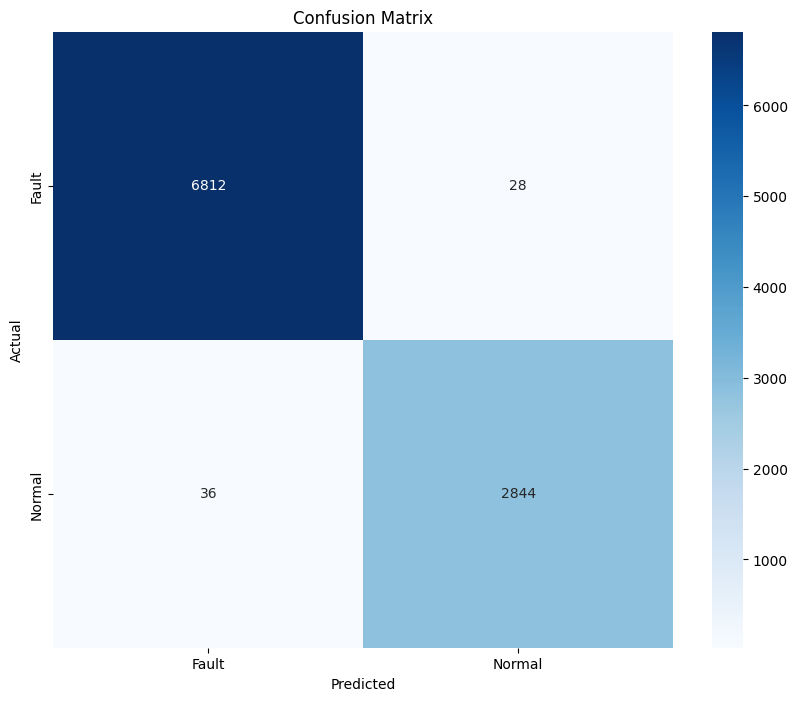

In [32]:
# Plot training loss
# plt.figure(figsize=(10, 6))
# plt.plot(range(1, EPOCHS+1), training_losses, 'b-', label='Training Loss')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.title('Training Loss Over Time')
# plt.legend()
# plt.grid(True)
# plt.show()

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

##Model Saving

In [33]:
# Save the trained model
model_save_path = 'vit_classifier.pth'
torch.save({
    'model_state_dict': model.state_dict(),
    'class_names': class_names,
    'class_mapping': class_mapping,
    'test_accuracy': test_accuracy
}, model_save_path)

print(f"Model saved to {model_save_path}")

Model saved to vit_classifier.pth


#SWIN TRANSFORMER - Image Classifier

In [34]:
# --- SWIN CONFIG ---
SWIN_DATA_ROOT = '/content/extracted_dataset/Dataset/250 RPM'
SWIN_BATCH_SIZE = 16
SWIN_EPOCHS = 2
SWIN_LR = 1e-4
SWIN_IMG_EXTS = ('.png', '.jpg', '.jpeg')

print(f"Swin Transformer Configuration:")
print(f"Data Root: {SWIN_DATA_ROOT}")
print(f"Batch Size: {SWIN_BATCH_SIZE}")
print(f"Epochs: {SWIN_EPOCHS}")
print(f"Learning Rate: {SWIN_LR}")
print(f"Supported Image Extensions: {SWIN_IMG_EXTS}")

Swin Transformer Configuration:
Data Root: /content/extracted_dataset/Dataset/250 RPM
Batch Size: 16
Epochs: 2
Learning Rate: 0.0001
Supported Image Extensions: ('.png', '.jpg', '.jpeg')


##Swin Dataset Preparation

In [35]:
# Reuse the same dataset functions or define them again if running independently
def swin_make_dataset(data_root):
    """Create dataset for Swin Transformer"""
    class_names = []
    samples = []
    class_to_idx = {}

    # Detect all class folders (direct subfolders)
    for cname in sorted(os.listdir(data_root)):
        class_dir = os.path.join(data_root, cname)
        if not os.path.isdir(class_dir):
            continue

        class_to_idx[cname] = len(class_names)
        class_names.append(cname)
        count = 0

        for root, dirs, files in os.walk(class_dir):
            for f in files:
                if f.lower().endswith(SWIN_IMG_EXTS):
                    samples.append((os.path.join(root, f), class_to_idx[cname]))
                    count += 1

        print(f"Class '{cname}': {count} images")

    print(f"Detected classes: {class_names}")
    return samples, class_names

# Load Swin dataset
swin_samples, swin_class_names = swin_make_dataset(SWIN_DATA_ROOT)
print(f"Found {len(swin_samples)} images for Swin Transformer.")

if len(swin_samples) == 0:
    print("No images found. Check your folder structure.")
else:
    print(f"Number of classes: {len(swin_class_names)}")
    print(f"Total samples: {len(swin_samples)}")

Class 'Fault': 68400 images
Class 'Normal': 28800 images
Detected classes: ['Fault', 'Normal']
Found 97200 images for Swin Transformer.
Number of classes: 2
Total samples: 97200


##Swin Data Split and Loaders


In [36]:
# Swin train/test split
swin_train_samples, swin_test_samples = train_test_split(
    swin_samples,
    test_size=0.2,
    random_state=42,
    stratify=[s[1] for s in swin_samples]
)

print(f"Swin Training samples: {len(swin_train_samples)}")
print(f"Swin Test samples: {len(swin_test_samples)}")

# Swin transforms
swin_weights = Swin_V2_B_Weights.DEFAULT
swin_transform = swin_weights.transforms()

print("Swin Transform pipeline:")
print(swin_transform)

# Swin datasets and loaders
swin_train_ds = FrameFolderDataset(swin_train_samples, swin_transform)
swin_test_ds = FrameFolderDataset(swin_test_samples, swin_transform)

swin_train_loader = DataLoader(swin_train_ds, batch_size=SWIN_BATCH_SIZE, shuffle=True)
swin_test_loader = DataLoader(swin_test_ds, batch_size=SWIN_BATCH_SIZE)

print(f"Swin Training batches: {len(swin_train_loader)}")
print(f"Swin Test batches: {len(swin_test_loader)}")

Swin Training samples: 77760
Swin Test samples: 19440
Swin Transform pipeline:
ImageClassification(
    crop_size=[256]
    resize_size=[272]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)
Swin Training batches: 4860
Swin Test batches: 1215


##Swin Model Setup


In [37]:
# Swin device and model setup
swin_device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Swin using device: {swin_device}")

# Load Swin Transformer V2
print("Loading Swin Transformer V2 (Base)...")
swin_model = swin_v2_b(weights=swin_weights)

# Replace the head for our number of classes
swin_model.head = torch.nn.Linear(swin_model.head.in_features, len(swin_class_names))
swin_model = swin_model.to(swin_device)

print(f"Swin Model loaded with {len(swin_class_names)} output classes")
print(f"Swin Classifier head: {swin_model.head}")

# Count Swin parameters
swin_total_params = sum(p.numel() for p in swin_model.parameters())
swin_trainable_params = sum(p.numel() for p in swin_model.parameters() if p.requires_grad)
print(f"Swin Total parameters: {swin_total_params:,}")
print(f"Swin Trainable parameters: {swin_trainable_params:,}")

Swin using device: cuda
Loading Swin Transformer V2 (Base)...


Downloading: "https://download.pytorch.org/models/swin_v2_b-781e5279.pth" to /root/.cache/torch/hub/checkpoints/swin_v2_b-781e5279.pth
100%|██████████| 336M/336M [00:01<00:00, 202MB/s]


Swin Model loaded with 2 output classes
Swin Classifier head: Linear(in_features=1024, out_features=2, bias=True)
Swin Total parameters: 86,907,898
Swin Trainable parameters: 86,907,898


##Swin Training Setup


In [38]:
# Swin loss function and optimizer
swin_criterion = torch.nn.CrossEntropyLoss()
swin_optimizer = torch.optim.Adam(swin_model.parameters(), lr=SWIN_LR)

print(f"Swin Loss function: {swin_criterion}")
print(f"Swin Optimizer: {swin_optimizer}")

Swin Loss function: CrossEntropyLoss()
Swin Optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


##Swin Training Loop


In [39]:
# Swin Training
print("Starting Swin Transformer training...")
swin_model.train()

swin_training_losses = []
swin_training_accuracies = []

for epoch in range(SWIN_EPOCHS):
    total_loss = 0
    correct = 0
    total = 0

    # Training loop with progress bar
    pbar = tqdm(swin_train_loader, desc=f"Swin Epoch {epoch+1}/{SWIN_EPOCHS}")
    for batch_idx, (imgs, lbls) in enumerate(pbar):
        imgs = imgs.to(swin_device)
        lbls = lbls.to(swin_device)

        # Forward pass
        swin_optimizer.zero_grad()
        outputs = swin_model(imgs)
        loss = swin_criterion(outputs, lbls)

        # Backward pass
        loss.backward()
        swin_optimizer.step()

        # Track loss and accuracy
        batch_loss = loss.item()
        total_loss += batch_loss

        # Calculate batch accuracy
        _, predicted = torch.max(outputs.data, 1)
        total += lbls.size(0)
        correct += (predicted == lbls).sum().item()

        # Update progress bar
        batch_acc = 100.0 * correct / total
        pbar.set_postfix({'Loss': f'{batch_loss:.4f}', 'Acc': f'{batch_acc:.2f}%'})

    # Calculate epoch statistics
    epoch_loss = total_loss / len(swin_train_loader)
    epoch_acc = 100.0 * correct / total

    swin_training_losses.append(epoch_loss)
    swin_training_accuracies.append(epoch_acc)

    print(f"Swin Epoch {epoch+1}/{SWIN_EPOCHS} - Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")

print("Swin training completed!")

Starting Swin Transformer training...


Swin Epoch 1/2: 100%|██████████| 4860/4860 [46:10<00:00,  1.75it/s, Loss=0.0001, Acc=99.34%]


Swin Epoch 1/2 - Loss: 0.0206, Accuracy: 99.34%


Swin Epoch 2/2: 100%|██████████| 4860/4860 [46:04<00:00,  1.76it/s, Loss=0.0002, Acc=99.83%]

Swin Epoch 2/2 - Loss: 0.0068, Accuracy: 99.83%
Swin training completed!


##Swin Model Evaluation


In [40]:
# Swin Evaluation
print("Evaluating Swin Transformer on test set...")
swin_model.eval()

swin_all_preds = []
swin_all_labels = []
swin_test_loss = 0

with torch.no_grad():
    for imgs, lbls in tqdm(swin_test_loader, desc="Swin Testing"):
        imgs = imgs.to(swin_device)
        lbls = lbls.to(swin_device)

        # Forward pass
        outputs = swin_model(imgs)
        loss = swin_criterion(outputs, lbls)
        swin_test_loss += loss.item()

        # Get predictions
        predictions = outputs.argmax(dim=1).cpu().numpy()
        swin_all_preds.extend(predictions)
        swin_all_labels.extend(lbls.cpu().numpy())

# Calculate Swin metrics
swin_test_accuracy = accuracy_score(swin_all_labels, swin_all_preds)
swin_avg_test_loss = swin_test_loss / len(swin_test_loader)

print(f"\nSwin Test Results:")
print(f"Test Loss: {swin_avg_test_loss:.4f}")
print(f"Test Accuracy: {swin_test_accuracy:.4f} ({swin_test_accuracy*100:.2f}%)")

Evaluating Swin Transformer on test set...


Swin Testing: 100%|██████████| 1215/1215 [04:29<00:00,  4.50it/s]


Swin Test Results:
Test Loss: 0.0002
Test Accuracy: 0.9999 (99.99%)


##Swin Results Analysis


In [41]:
def swin_plot_confusion_matrix(y_true, y_pred, class_names, model_name='Swin Transformer', save_path=None):
    """
    Plot and save confusion matrix for Swin Transformer.
    """
    from sklearn.metrics import confusion_matrix
    import matplotlib.pyplot as plt
    import seaborn as sns

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names,
                cbar_kws={'label': 'Count'})
    plt.title(f'{model_name} - Confusion Matrix', fontsize=16, fontweight='bold')
    plt.ylabel('True Label', fontsize=12)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Confusion matrix saved to: {save_path}")

    plt.show()

    # Print confusion matrix values
    print(f"\nConfusion Matrix Values:")
    print(cm)



SWIN TRANSFORMER V2 FINAL RESULTS
Test Accuracy: 0.9999 (99.99%)

Swin Detailed Classification Report:
              precision    recall  f1-score   support

       Fault     1.0000    0.9999    1.0000     13680
      Normal     0.9998    1.0000    0.9999      5760

    accuracy                         0.9999     19440
   macro avg     0.9999    1.0000    0.9999     19440
weighted avg     0.9999    0.9999    0.9999     19440


Swin Class mapping: {0: 'Fault', 1: 'Normal'}
Confusion matrix saved to: swin_confusion_matrix.png


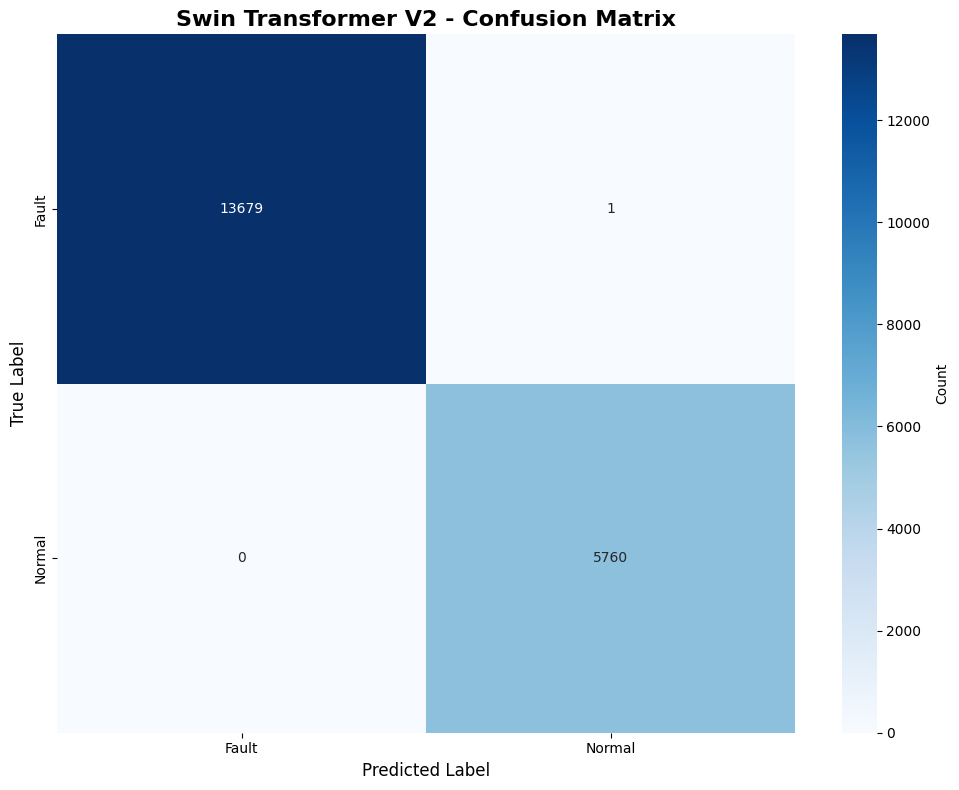


Confusion Matrix Values:
[[13679     1]
 [    0  5760]]


In [42]:
# Swin detailed results
print(f"\n{'='*50}")
print(f"SWIN TRANSFORMER V2 FINAL RESULTS")
print(f"{'='*50}")
print(f"Test Accuracy: {swin_test_accuracy:.4f} ({swin_test_accuracy*100:.2f}%)")

print(f"\nSwin Detailed Classification Report:")
swin_report = classification_report(swin_all_labels, swin_all_preds, target_names=swin_class_names, digits=4)
print(swin_report)

# Swin class mapping
swin_class_mapping = {i: name for i, name in enumerate(swin_class_names)}
print(f"\nSwin Class mapping: {swin_class_mapping}")

# Plot Swin confusion matrix
swin_save_path = 'swin_confusion_matrix.png'
swin_plot_confusion_matrix(swin_all_labels, swin_all_preds, swin_class_names,
                     "Swin Transformer V2", swin_save_path)

##Swin Visualization


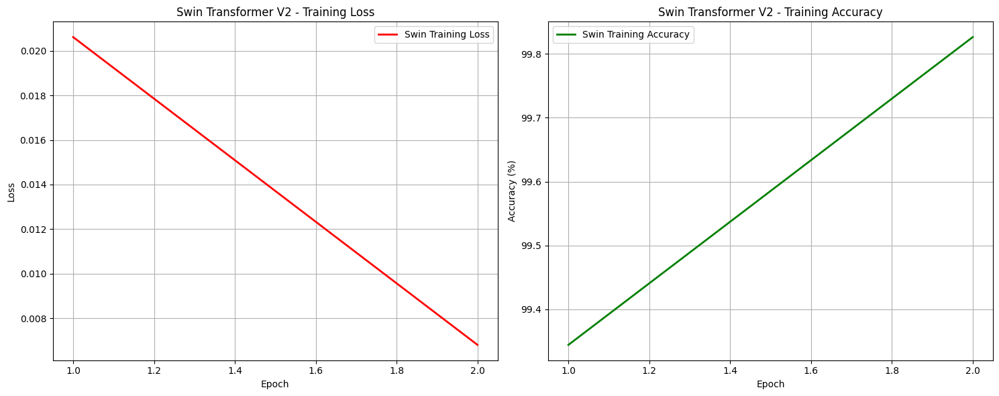

In [43]:
# Plot Swin training metrics
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Swin training loss
ax1.plot(range(1, SWIN_EPOCHS+1), swin_training_losses, 'r-', label='Swin Training Loss', linewidth=2)
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Swin Transformer V2 - Training Loss')
ax1.legend()
ax1.grid(True)

# Swin training accuracy
ax2.plot(range(1, SWIN_EPOCHS+1), swin_training_accuracies, 'g-', label='Swin Training Accuracy', linewidth=2)
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy (%)')
ax2.set_title('Swin Transformer V2 - Training Accuracy')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.savefig('swin_training_metrics.png', dpi=300, bbox_inches='tight')
plt.show()

##Swin Model Saving


In [44]:
# Save Swin model with comprehensive metadata
swin_model_save_path = 'swin_roi_classifier.pth'

swin_save_dict = {
    'model_state_dict': swin_model.state_dict(),
    'optimizer_state_dict': swin_optimizer.state_dict(),
    'model_type': 'swin',
    'model_name': 'Swin Transformer V2',
    'class_names': swin_class_names,
    'class_mapping': swin_class_mapping,
    'test_accuracy': swin_test_accuracy,
    'training_losses': swin_training_losses,
    'training_accuracies': swin_training_accuracies,
    'epochs': SWIN_EPOCHS,
    'batch_size': SWIN_BATCH_SIZE,
    'learning_rate': SWIN_LR,
    'total_params': swin_total_params,
    'trainable_params': swin_trainable_params
}

torch.save(swin_save_dict, swin_model_save_path)
print(f"Swin model saved to: {swin_model_save_path}")

# Save Swin training metrics
import json
swin_metrics_save_path = 'swin_training_metrics.json'
swin_metrics = {
    'model_type': 'swin',
    'test_accuracy': float(swin_test_accuracy),
    'training_losses': [float(loss) for loss in swin_training_losses],
    'training_accuracies': [float(acc) for acc in swin_training_accuracies],
    'epochs': SWIN_EPOCHS,
    'final_training_loss': float(swin_training_losses[-1]),
    'final_training_accuracy': float(swin_training_accuracies[-1])
}

with open(swin_metrics_save_path, 'w') as f:
    json.dump(swin_metrics, f, indent=2)
print(f"Swin training metrics saved to: {swin_metrics_save_path}")

Swin model saved to: swin_roi_classifier.pth
Swin training metrics saved to: swin_training_metrics.json


#CONVNEXT Model - Image Classifier

In [45]:
# --- CONVNEXT CONFIG ---
CONVNEXT_DATA_ROOT = '/content/extracted_dataset/Dataset/250 RPM'
CONVNEXT_BATCH_SIZE = 16
CONVNEXT_EPOCHS = 2
CONVNEXT_LR = 1e-4
CONVNEXT_IMG_EXTS = ('.png', '.jpg', '.jpeg')

print(f"ConvNeXt Configuration:")
print(f"Data Root: {CONVNEXT_DATA_ROOT}")
print(f"Batch Size: {CONVNEXT_BATCH_SIZE}")
print(f"Epochs: {CONVNEXT_EPOCHS}")
print(f"Learning Rate: {CONVNEXT_LR}")
print(f"Supported Image Extensions: {CONVNEXT_IMG_EXTS}")

ConvNeXt Configuration:
Data Root: /content/extracted_dataset/Dataset/250 RPM
Batch Size: 16
Epochs: 2
Learning Rate: 0.0001
Supported Image Extensions: ('.png', '.jpg', '.jpeg')


##ConvNeXt Dataset Preparation


In [46]:
# Import ConvNeXt model
from torchvision.models import convnext_base, ConvNeXt_Base_Weights

def convnext_make_dataset(data_root):
    """Create dataset for ConvNeXt"""
    class_names = []
    samples = []
    class_to_idx = {}

    # Detect all class folders (direct subfolders)
    for cname in sorted(os.listdir(data_root)):
        class_dir = os.path.join(data_root, cname)
        if not os.path.isdir(class_dir):
            continue

        class_to_idx[cname] = len(class_names)
        class_names.append(cname)
        count = 0

        for root, dirs, files in os.walk(class_dir):
            for f in files:
                if f.lower().endswith(CONVNEXT_IMG_EXTS):
                    samples.append((os.path.join(root, f), class_to_idx[cname]))
                    count += 1

        print(f"Class '{cname}': {count} images")

    print(f"Detected classes: {class_names}")
    return samples, class_names

# Load ConvNeXt dataset
convnext_samples, convnext_class_names = convnext_make_dataset(CONVNEXT_DATA_ROOT)
print(f"Found {len(convnext_samples)} images for ConvNeXt.")

if len(convnext_samples) == 0:
    print("No images found. Check your folder structure.")
else:
    print(f"Number of classes: {len(convnext_class_names)}")
    print(f"Total samples: {len(convnext_samples)}")

Class 'Fault': 68400 images
Class 'Normal': 28800 images
Detected classes: ['Fault', 'Normal']
Found 97200 images for ConvNeXt.
Number of classes: 2
Total samples: 97200


##ConvNeXt Data Split and Loaders


In [47]:
# ConvNeXt train/test split
convnext_train_samples, convnext_test_samples = train_test_split(
    convnext_samples,
    test_size=0.2,
    random_state=42,
    stratify=[s[1] for s in convnext_samples]
)

print(f"ConvNeXt Training samples: {len(convnext_train_samples)}")
print(f"ConvNeXt Test samples: {len(convnext_test_samples)}")

# ConvNeXt transforms
convnext_weights = ConvNeXt_Base_Weights.DEFAULT
convnext_transform = convnext_weights.transforms()

print("ConvNeXt Transform pipeline:")
print(convnext_transform)

# ConvNeXt datasets and loaders
convnext_train_ds = FrameFolderDataset(convnext_train_samples, convnext_transform)
convnext_test_ds = FrameFolderDataset(convnext_test_samples, convnext_transform)

convnext_train_loader = DataLoader(convnext_train_ds, batch_size=CONVNEXT_BATCH_SIZE, shuffle=True)
convnext_test_loader = DataLoader(convnext_test_ds, batch_size=CONVNEXT_BATCH_SIZE)

print(f"ConvNeXt Training batches: {len(convnext_train_loader)}")
print(f"ConvNeXt Test batches: {len(convnext_test_loader)}")

ConvNeXt Training samples: 77760
ConvNeXt Test samples: 19440
ConvNeXt Transform pipeline:
ImageClassification(
    crop_size=[224]
    resize_size=[232]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)
ConvNeXt Training batches: 4860
ConvNeXt Test batches: 1215


##ConvNeXt Model Setup


In [48]:
# ConvNeXt device and model setup
convnext_device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"ConvNeXt using device: {convnext_device}")

# Load ConvNeXt Base model
print("Loading ConvNeXt Base...")
convnext_model = convnext_base(weights=convnext_weights)

# Replace the classifier for our number of classes
convnext_model.classifier[2] = torch.nn.Linear(convnext_model.classifier[2].in_features, len(convnext_class_names))
convnext_model = convnext_model.to(convnext_device)

print(f"ConvNeXt Model loaded with {len(convnext_class_names)} output classes")
print(f"ConvNeXt Classifier: {convnext_model.classifier[2]}")

# Count ConvNeXt parameters
convnext_total_params = sum(p.numel() for p in convnext_model.parameters())
convnext_trainable_params = sum(p.numel() for p in convnext_model.parameters() if p.requires_grad)
print(f"ConvNeXt Total parameters: {convnext_total_params:,}")
print(f"ConvNeXt Trainable parameters: {convnext_trainable_params:,}")

ConvNeXt using device: cuda
Loading ConvNeXt Base...


Downloading: "https://download.pytorch.org/models/convnext_base-6075fbad.pth" to /root/.cache/torch/hub/checkpoints/convnext_base-6075fbad.pth
100%|██████████| 338M/338M [00:01<00:00, 196MB/s]


ConvNeXt Model loaded with 2 output classes
ConvNeXt Classifier: Linear(in_features=1024, out_features=2, bias=True)
ConvNeXt Total parameters: 87,568,514
ConvNeXt Trainable parameters: 87,568,514


##ConvNeXt Training Setup


In [49]:
# ConvNeXt loss function and optimizer
convnext_criterion = torch.nn.CrossEntropyLoss()
convnext_optimizer = torch.optim.Adam(convnext_model.parameters(), lr=CONVNEXT_LR)

print(f"ConvNeXt Loss function: {convnext_criterion}")
print(f"ConvNeXt Optimizer: {convnext_optimizer}")

ConvNeXt Loss function: CrossEntropyLoss()
ConvNeXt Optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


##ConvNeXt Training Loop


In [50]:
# ConvNeXt Training
print("Starting ConvNeXt training...")
convnext_model.train()

convnext_training_losses = []
convnext_training_accuracies = []

for epoch in range(CONVNEXT_EPOCHS):
    total_loss = 0
    correct = 0
    total = 0

    # Training loop with progress bar
    pbar = tqdm(convnext_train_loader, desc=f"ConvNeXt Epoch {epoch+1}/{CONVNEXT_EPOCHS}")
    for batch_idx, (imgs, lbls) in enumerate(pbar):
        imgs = imgs.to(convnext_device)
        lbls = lbls.to(convnext_device)

        # Forward pass
        convnext_optimizer.zero_grad()
        outputs = convnext_model(imgs)
        loss = convnext_criterion(outputs, lbls)

        # Backward pass
        loss.backward()
        convnext_optimizer.step()

        # Track loss and accuracy
        batch_loss = loss.item()
        total_loss += batch_loss

        # Calculate batch accuracy
        _, predicted = torch.max(outputs.data, 1)
        total += lbls.size(0)
        correct += (predicted == lbls). sum().item()

        # Update progress bar
        batch_acc = 100.0 * correct / total
        pbar.set_postfix({'Loss': f'{batch_loss:.4f}', 'Acc': f'{batch_acc:.2f}%'})

    # Calculate epoch statistics
    epoch_loss = total_loss / len(convnext_train_loader)
    epoch_acc = 100.0 * correct / total

    convnext_training_losses.append(epoch_loss)
    convnext_training_accuracies.append(epoch_acc)

    print(f"ConvNeXt Epoch {epoch+1}/{CONVNEXT_EPOCHS} - Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%")

print("ConvNeXt training completed!")

Starting ConvNeXt training...


ConvNeXt Epoch 1/2: 100%|██████████| 4860/4860 [1:47:20<00:00,  1.33s/it, Loss=0.0017, Acc=99.61%]


ConvNeXt Epoch 1/2 - Loss: 0.0124, Accuracy: 99.61%


ConvNeXt Epoch 2/2: 100%|██████████| 4860/4860 [1:47:29<00:00,  1.33s/it, Loss=0.0001, Acc=99.90%]

ConvNeXt Epoch 2/2 - Loss: 0.0042, Accuracy: 99.90%
ConvNeXt training completed!


##ConvNeXt Model Evaluation


In [51]:
# ConvNeXt Evaluation
print("Evaluating ConvNeXt on test set...")
convnext_model.eval()

convnext_all_preds = []
convnext_all_labels = []
convnext_test_loss = 0

with torch.no_grad():
    for imgs, lbls in tqdm(convnext_test_loader, desc="ConvNeXt Testing"):
        imgs = imgs.to(convnext_device)
        lbls = lbls.to(convnext_device)

        # Forward pass
        outputs = convnext_model(imgs)
        loss = convnext_criterion(outputs, lbls)
        convnext_test_loss += loss.item()

        # Get predictions
        predictions = outputs.argmax(dim=1).cpu().numpy()
        convnext_all_preds.extend(predictions)
        convnext_all_labels.extend(lbls.cpu().numpy())

# Calculate ConvNeXt metrics
convnext_test_accuracy = accuracy_score(convnext_all_labels, convnext_all_preds)
convnext_avg_test_loss = convnext_test_loss / len(convnext_test_loader)

print(f"\nConvNeXt Test Results:")
print(f"Test Loss: {convnext_avg_test_loss:.4f}")
print(f"Test Accuracy: {convnext_test_accuracy:.4f} ({convnext_test_accuracy*100:.2f}%)")

Evaluating ConvNeXt on test set...


ConvNeXt Testing: 100%|██████████| 1215/1215 [03:10<00:00,  6.36it/s]


ConvNeXt Test Results:
Test Loss: 0.0000
Test Accuracy: 1.0000 (100.00%)


##ConvNeXt Results Analysis



CONVNEXT BASE FINAL RESULTS
Test Accuracy: 1.0000 (100.00%)

ConvNeXt Detailed Classification Report:
              precision    recall  f1-score   support

       Fault     1.0000    1.0000    1.0000     13680
      Normal     1.0000    1.0000    1.0000      5760

    accuracy                         1.0000     19440
   macro avg     1.0000    1.0000    1.0000     19440
weighted avg     1.0000    1.0000    1.0000     19440


ConvNeXt Class mapping: {0: 'Fault', 1: 'Normal'}
Confusion matrix saved to: convnext_confusion_matrix.png


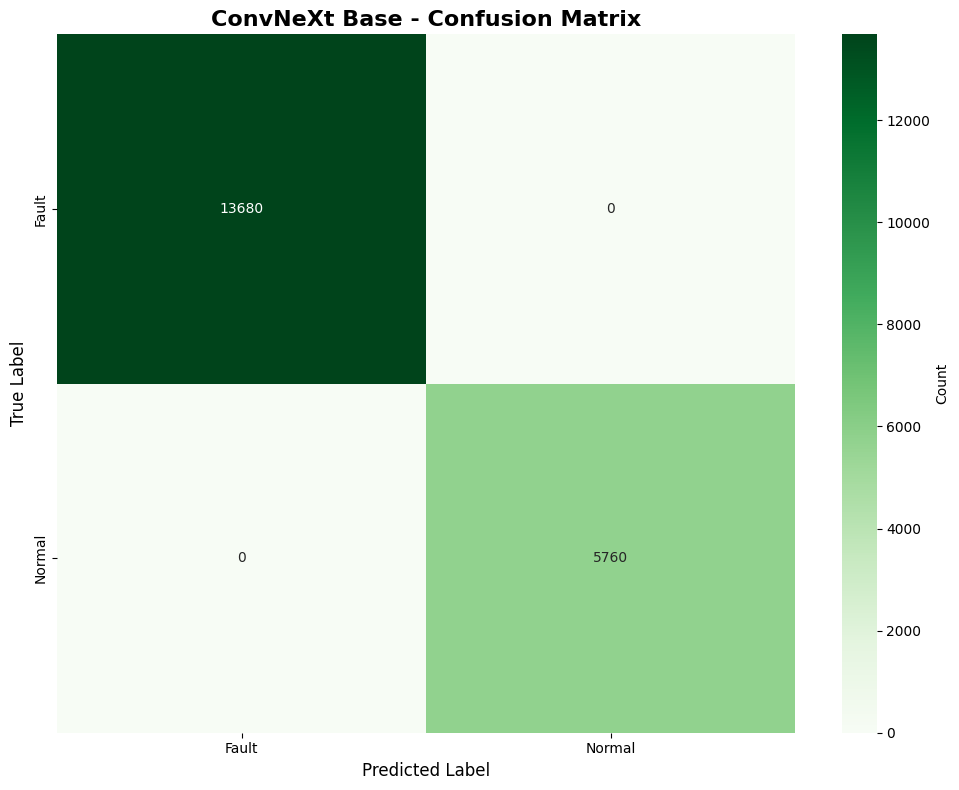


Confusion Matrix Values:
[[13680     0]
 [    0  5760]]


In [52]:
# Define plot function for ConvNeXt section (independent)
def convnext_plot_confusion_matrix(y_true, y_pred, class_names, model_name='ConvNeXt', save_path=None):
    """
    Plot and save confusion matrix for ConvNeXt.
    """
    from sklearn.metrics import confusion_matrix
    import matplotlib.pyplot as plt
    import seaborn as sns

    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
                xticklabels=class_names, yticklabels=class_names,
                cbar_kws={'label': 'Count'})
    plt.title(f'{model_name} - Confusion Matrix', fontsize=16, fontweight='bold')
    plt.ylabel('True Label', fontsize=12)
    plt.xlabel('Predicted Label', fontsize=12)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Confusion matrix saved to: {save_path}")

    plt.show()

    # Print confusion matrix values
    print(f"\nConfusion Matrix Values:")
    print(cm)

# ConvNeXt detailed results
print(f"\n{'='*50}")
print(f"CONVNEXT BASE FINAL RESULTS")
print(f"{'='*50}")
print(f"Test Accuracy: {convnext_test_accuracy:.4f} ({convnext_test_accuracy*100:.2f}%)")

print(f"\nConvNeXt Detailed Classification Report:")
convnext_report = classification_report(convnext_all_labels, convnext_all_preds, target_names=convnext_class_names, digits=4)
print(convnext_report)

# ConvNeXt class mapping
convnext_class_mapping = {i: name for i, name in enumerate(convnext_class_names)}
print(f"\nConvNeXt Class mapping: {convnext_class_mapping}")

# Plot ConvNeXt confusion matrix
convnext_save_path = 'convnext_confusion_matrix.png'
convnext_plot_confusion_matrix(convnext_all_labels, convnext_all_preds, convnext_class_names,
                               "ConvNeXt Base", convnext_save_path)

##ConvNeXt Visualization


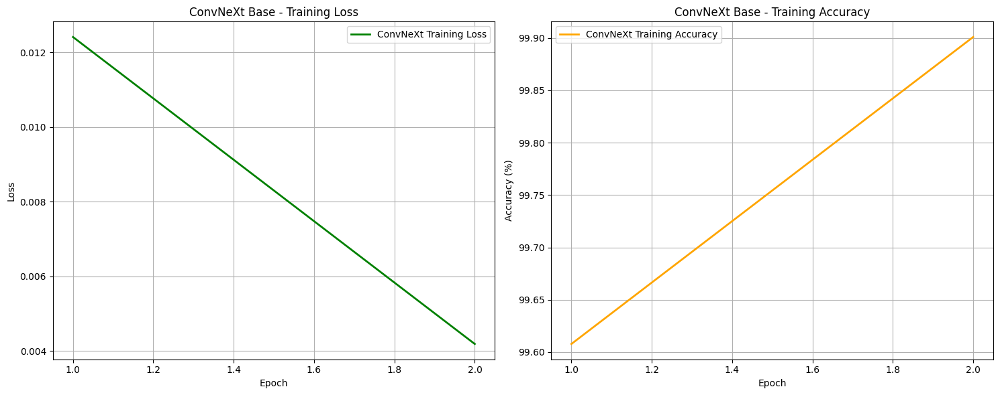

In [53]:
# Plot ConvNeXt training metrics
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# ConvNeXt training loss
ax1.plot(range(1, CONVNEXT_EPOCHS+1), convnext_training_losses, 'g-', label='ConvNeXt Training Loss', linewidth=2)
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('ConvNeXt Base - Training Loss')
ax1.legend()
ax1.grid(True)

# ConvNeXt training accuracy
ax2.plot(range(1, CONVNEXT_EPOCHS+1), convnext_training_accuracies, 'orange', label='ConvNeXt Training Accuracy', linewidth=2)
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy (%)')
ax2.set_title('ConvNeXt Base - Training Accuracy')
ax2.legend()
ax2.grid(True)

plt.tight_layout()
plt.savefig('convnext_training_metrics.png', dpi=300, bbox_inches='tight')
plt.show()

##ConvNeXt Model Saving


In [54]:
# Save ConvNeXt model with comprehensive metadata
convnext_model_save_path = 'convnext_roi_classifier.pth'

convnext_save_dict = {
    'model_state_dict': convnext_model.state_dict(),
    'optimizer_state_dict': convnext_optimizer.state_dict(),
    'model_type': 'convnext',
    'model_name': 'ConvNeXt Base',
    'class_names': convnext_class_names,
    'class_mapping': convnext_class_mapping,
    'test_accuracy': convnext_test_accuracy,
    'training_losses': convnext_training_losses,
    'training_accuracies': convnext_training_accuracies,
    'epochs': CONVNEXT_EPOCHS,
    'batch_size': CONVNEXT_BATCH_SIZE,
    'learning_rate': CONVNEXT_LR,
    'total_params': convnext_total_params,
    'trainable_params': convnext_trainable_params
}

torch.save(convnext_save_dict, convnext_model_save_path)
print(f"ConvNeXt model saved to: {convnext_model_save_path}")

# Save ConvNeXt training metrics
import json
convnext_metrics_save_path = 'convnext_training_metrics.json'
convnext_metrics = {
    'model_type': 'convnext',
    'test_accuracy': float(convnext_test_accuracy),
    'training_losses': [float(loss) for loss in convnext_training_losses],
    'training_accuracies': [float(acc) for acc in convnext_training_accuracies],
    'epochs': CONVNEXT_EPOCHS,
    'final_training_loss': float(convnext_training_losses[-1]),
    'final_training_accuracy': float(convnext_training_accuracies[-1])
}

with open(convnext_metrics_save_path, 'w') as f:
    json.dump(convnext_metrics, f, indent=2)
print(f"ConvNeXt training metrics saved to: {convnext_metrics_save_path}")

ConvNeXt model saved to: convnext_roi_classifier.pth
ConvNeXt training metrics saved to: convnext_training_metrics.json
